In [2]:
from roboflow import Roboflow
rf = Roboflow(api_key="RoILXxeyIqBkITIuYmKf")
project = rf.workspace("tishas-workplace").project("traffic-congestion-detection-vbbnb")
version = project.version(2)
dataset = version.download("yolov8")

loading Roboflow workspace...
loading Roboflow project...



Extracting Dataset Version Zip to Traffic-Congestion-Detection-2 in yolov8:: 100%|██████████| 6672/6672 [00:05<00:00, 1213.99it/s]


# Traffic Dataset Analysis

This notebook analyzes the Bangladesh Traffic Congestion Detection dataset, including YAML configuration, dataset distribution, and class statistics.

In [2]:
# Import required libraries
import yaml
import os
from pathlib import Path
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
import numpy as np
from collections import Counter, defaultdict
from PIL import Image
import cv2

# Set style for better visualizations
sns.set_style("whitegrid")
plt.rcParams['figure.figsize'] = (12, 6)

## 1. YAML Configuration Analysis

In [4]:
# Define paths
base_dir = Path('/mnt/Academia/Coding101/Inteligent Machine/bd-traffic-monitoring-system')
dataset_dir = base_dir / 'Traffic-Congestion-Detection-2'
yaml_path = dataset_dir / 'data.yaml'

# Load and parse YAML file
with open(yaml_path, 'r') as f:
    data_config = yaml.safe_load(f)

print("=" * 60)
print("YAML CONFIGURATION ANALYSIS")
print("=" * 60)
print(f"\nDataset Name: Traffic Congestion Detection")
print(f"Number of Classes: {data_config['nc']}")
print(f"\nVehicle Classes:")
for idx, class_name in enumerate(data_config['names']):
    print(f"  {idx}: {class_name}")

print(f"\nDataset Paths:")
print(f"  Train: {data_config['train']}")
print(f"  Valid: {data_config['val']}")
print(f"  Test: {data_config['test']}")

print(f"\nRoboflow Project Info:")
print(f"  Workspace: {data_config['roboflow']['workspace']}")
print(f"  Project: {data_config['roboflow']['project']}")
print(f"  Version: {data_config['roboflow']['version']}")
print(f"  License: {data_config['roboflow']['license']}")

# Store for later use
class_names = data_config['names']
num_classes = data_config['nc']

YAML CONFIGURATION ANALYSIS

Dataset Name: Traffic Congestion Detection
Number of Classes: 8

Vehicle Classes:
  0: Bike
  1: Bus
  2: Car
  3: Cng
  4: Cycle
  5: Mini-Truck
  6: Rickshaw
  7: Truck

Dataset Paths:
  Train: ../train/images
  Valid: ../valid/images
  Test: ../test/images

Roboflow Project Info:
  Workspace: tishas-workplace
  Project: traffic-congestion-detection-vbbnb
  Version: 2
  License: CC BY 4.0


## 2. Dataset Distribution Analysis

In [5]:
# Count images in each split
splits = {
    'train': dataset_dir / 'train' / 'images',
    'valid': dataset_dir / 'valid' / 'images',
    'test': dataset_dir / 'test' / 'images'
}

image_counts = {}
for split_name, split_path in splits.items():
    if split_path.exists():
        images = list(split_path.glob('*'))
        # Filter only image files
        images = [img for img in images if img.suffix.lower() in ['.jpg', '.jpeg', '.png']]
        image_counts[split_name] = len(images)
    else:
        image_counts[split_name] = 0

total_images = sum(image_counts.values())

print("=" * 60)
print("DATASET DISTRIBUTION")
print("=" * 60)
print(f"\nTotal Images: {total_images}")
print(f"\nSplit Distribution:")
for split, count in image_counts.items():
    percentage = (count / total_images * 100) if total_images > 0 else 0
    print(f"  {split.capitalize():8} - {count:4} images ({percentage:.1f}%)")

# Create dataset info dictionary
dataset_info = {
    'split': list(image_counts.keys()),
    'count': list(image_counts.values()),
    'percentage': [(c/total_images*100) if total_images > 0 else 0 for c in image_counts.values()]
}

DATASET DISTRIBUTION

Total Images: 3330

Split Distribution:
  Train    - 2321 images (69.7%)
  Valid    -  658 images (19.8%)
  Test     -  351 images (10.5%)


## 3. Class Distribution Analysis

In [6]:
# Analyze labels for each split
def count_labels_in_split(split_path):
    """Count instances of each class in a dataset split."""
    label_path = split_path.parent / 'labels'
    class_counts = Counter()
    total_annotations = 0
    
    if not label_path.exists():
        return class_counts, total_annotations
    
    for label_file in label_path.glob('*.txt'):
        with open(label_file, 'r') as f:
            lines = f.readlines()
            for line in lines:
                parts = line.strip().split()
                if parts:
                    class_id = int(parts[0])
                    class_counts[class_id] += 1
                    total_annotations += 1
    
    return class_counts, total_annotations

# Count labels for all splits
all_class_counts = defaultdict(lambda: {'train': 0, 'valid': 0, 'test': 0})
split_totals = {}

print("=" * 60)
print("CLASS DISTRIBUTION ANALYSIS")
print("=" * 60)

for split_name, split_path in splits.items():
    class_counts, total = count_labels_in_split(split_path)
    split_totals[split_name] = total
    
    print(f"\n{split_name.upper()} Split:")
    print(f"  Total Annotations: {total}")
    print(f"  Annotations per Image: {total/image_counts[split_name]:.2f}" if image_counts[split_name] > 0 else "  N/A")
    
    for class_id, count in sorted(class_counts.items()):
        all_class_counts[class_id][split_name] = count

# Print overall class distribution
print(f"\n{'=' * 60}")
print("OVERALL CLASS DISTRIBUTION")
print(f"{'=' * 60}")
print(f"{'Class':<15} {'Train':>8} {'Valid':>8} {'Test':>8} {'Total':>8} {'%':>8}")
print("-" * 60)

total_all = sum(split_totals.values())
for class_id in range(num_classes):
    class_name = class_names[class_id]
    train_count = all_class_counts[class_id]['train']
    valid_count = all_class_counts[class_id]['valid']
    test_count = all_class_counts[class_id]['test']
    class_total = train_count + valid_count + test_count
    percentage = (class_total / total_all * 100) if total_all > 0 else 0
    
    print(f"{class_name:<15} {train_count:>8} {valid_count:>8} {test_count:>8} {class_total:>8} {percentage:>7.1f}%")

print("-" * 60)
print(f"{'TOTAL':<15} {split_totals['train']:>8} {split_totals['valid']:>8} {split_totals['test']:>8} {total_all:>8} {'100.0':>7}%")

CLASS DISTRIBUTION ANALYSIS

TRAIN Split:
  Total Annotations: 18865
  Annotations per Image: 8.13

VALID Split:
  Total Annotations: 5103
  Annotations per Image: 7.76

TEST Split:
  Total Annotations: 2885
  Annotations per Image: 8.22

OVERALL CLASS DISTRIBUTION
Class              Train    Valid     Test    Total        %
------------------------------------------------------------
Bike                1801      502      228     2531     9.4%
Bus                 2604      715      428     3747    14.0%
Car                 6484     1693      994     9171    34.2%
Cng                 2362      588      326     3276    12.2%
Cycle                362       97       51      510     1.9%
Mini-Truck           971      279      163     1413     5.3%
Rickshaw            3115      924      514     4553    17.0%
Truck               1166      305      181     1652     6.2%
------------------------------------------------------------
TOTAL              18865     5103     2885    26853   100.0%


## 4. Visualizations

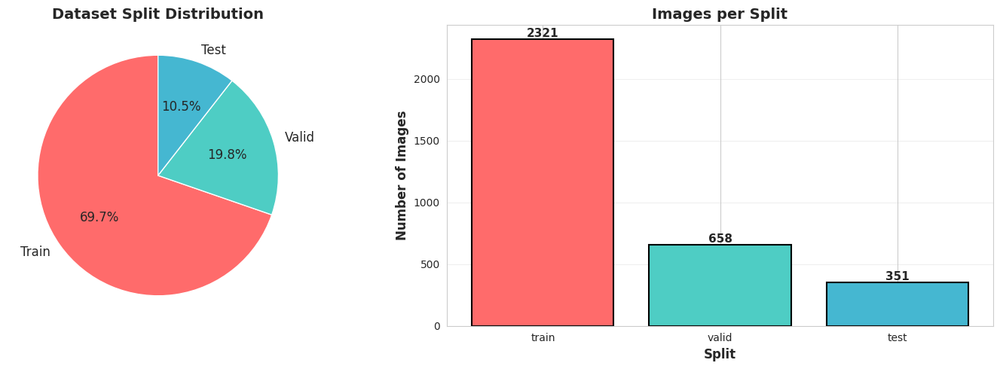

In [7]:
# 1. Dataset Split Distribution
fig, axes = plt.subplots(1, 2, figsize=(15, 5))

# Pie chart
colors = ['#FF6B6B', '#4ECDC4', '#45B7D1']
axes[0].pie(dataset_info['percentage'], labels=[s.capitalize() for s in dataset_info['split']], 
            autopct='%1.1f%%', colors=colors, startangle=90, textprops={'fontsize': 12})
axes[0].set_title('Dataset Split Distribution', fontsize=14, fontweight='bold')

# Bar chart
bars = axes[1].bar(dataset_info['split'], dataset_info['count'], color=colors, edgecolor='black', linewidth=1.5)
axes[1].set_xlabel('Split', fontsize=12, fontweight='bold')
axes[1].set_ylabel('Number of Images', fontsize=12, fontweight='bold')
axes[1].set_title('Images per Split', fontsize=14, fontweight='bold')
axes[1].grid(axis='y', alpha=0.3)

# Add value labels on bars
for bar in bars:
    height = bar.get_height()
    axes[1].text(bar.get_x() + bar.get_width()/2., height,
                f'{int(height)}',
                ha='center', va='bottom', fontsize=11, fontweight='bold')

plt.tight_layout()
plt.show()

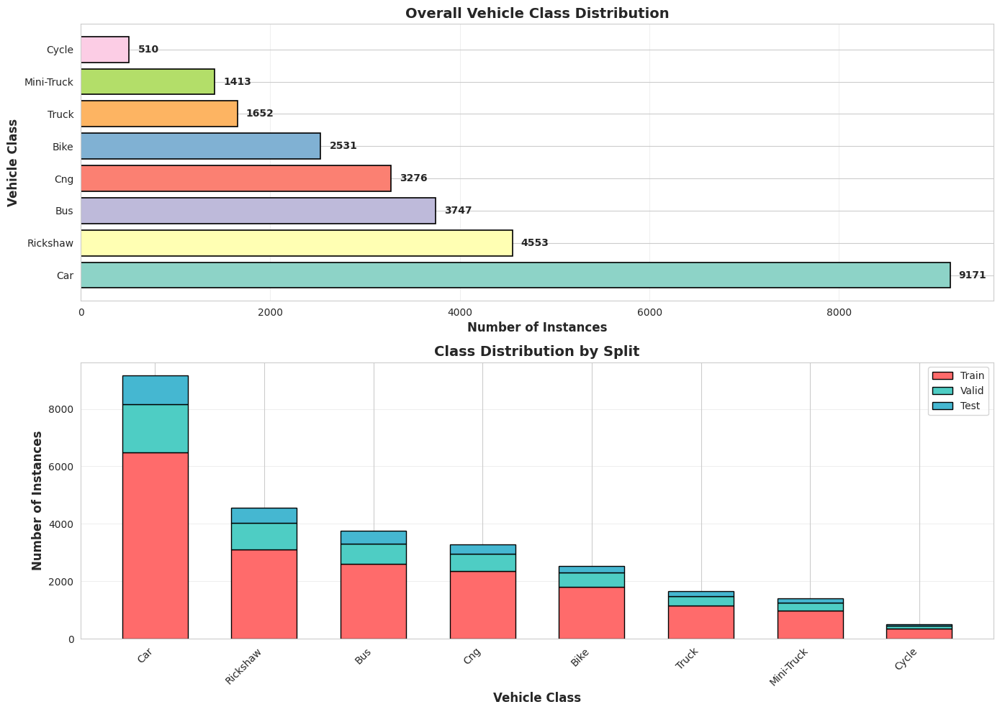

In [8]:
# 2. Class Distribution Visualization
class_totals = []
for class_id in range(num_classes):
    total = sum([all_class_counts[class_id][split] for split in ['train', 'valid', 'test']])
    class_totals.append((class_names[class_id], total))

class_totals.sort(key=lambda x: x[1], reverse=True)
sorted_classes = [c[0] for c in class_totals]
sorted_counts = [c[1] for c in class_totals]

fig, axes = plt.subplots(2, 1, figsize=(14, 10))

# Overall class distribution
colors_bar = plt.cm.Set3(range(len(sorted_classes)))
bars = axes[0].barh(sorted_classes, sorted_counts, color=colors_bar, edgecolor='black', linewidth=1.2)
axes[0].set_xlabel('Number of Instances', fontsize=12, fontweight='bold')
axes[0].set_ylabel('Vehicle Class', fontsize=12, fontweight='bold')
axes[0].set_title('Overall Vehicle Class Distribution', fontsize=14, fontweight='bold')
axes[0].grid(axis='x', alpha=0.3)

# Add value labels
for i, (bar, count) in enumerate(zip(bars, sorted_counts)):
    axes[0].text(count + max(sorted_counts)*0.01, bar.get_y() + bar.get_height()/2,
                f'{count}',
                ha='left', va='center', fontsize=10, fontweight='bold')

# Stacked bar chart for split distribution per class
train_counts = [all_class_counts[class_names.index(cls)]['train'] for cls in sorted_classes]
valid_counts = [all_class_counts[class_names.index(cls)]['valid'] for cls in sorted_classes]
test_counts = [all_class_counts[class_names.index(cls)]['test'] for cls in sorted_classes]

x_pos = np.arange(len(sorted_classes))
width = 0.6

p1 = axes[1].bar(x_pos, train_counts, width, label='Train', color='#FF6B6B', edgecolor='black', linewidth=1)
p2 = axes[1].bar(x_pos, valid_counts, width, bottom=train_counts, label='Valid', color='#4ECDC4', edgecolor='black', linewidth=1)
p3 = axes[1].bar(x_pos, test_counts, width, bottom=np.array(train_counts)+np.array(valid_counts), 
                 label='Test', color='#45B7D1', edgecolor='black', linewidth=1)

axes[1].set_xlabel('Vehicle Class', fontsize=12, fontweight='bold')
axes[1].set_ylabel('Number of Instances', fontsize=12, fontweight='bold')
axes[1].set_title('Class Distribution by Split', fontsize=14, fontweight='bold')
axes[1].set_xticks(x_pos)
axes[1].set_xticklabels(sorted_classes, rotation=45, ha='right')
axes[1].legend(loc='upper right', fontsize=10)
axes[1].grid(axis='y', alpha=0.3)

plt.tight_layout()
plt.show()

## 5. Sample Images with Annotations

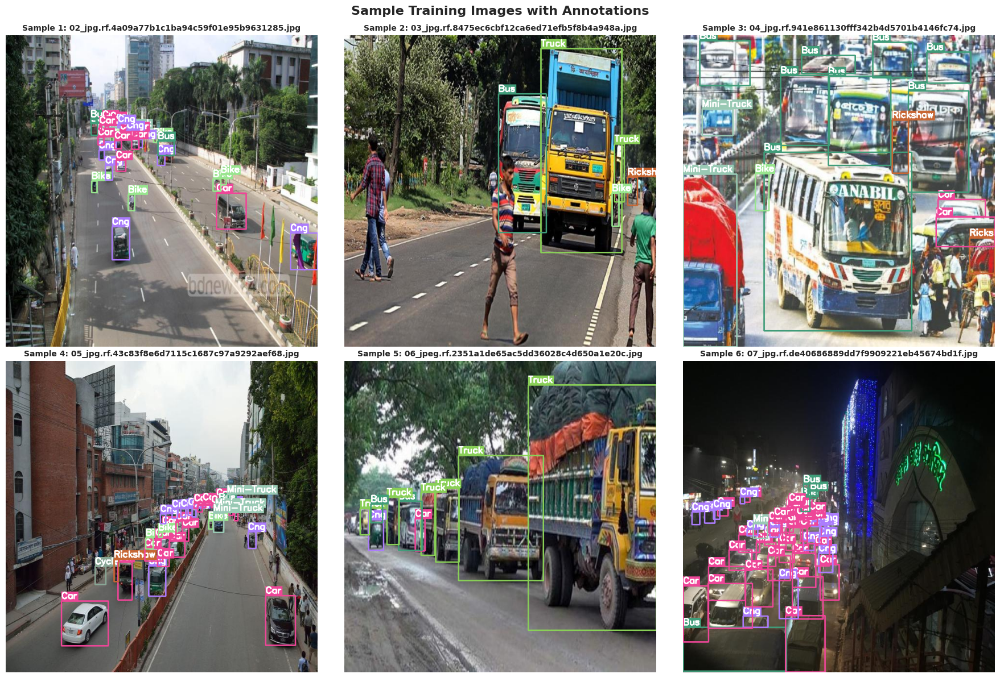

In [9]:
# Function to draw bounding boxes on images
def draw_boxes_on_image(image_path, label_path, class_names):
    """Draw bounding boxes on an image based on YOLO format labels."""
    # Read image
    img = cv2.imread(str(image_path))
    if img is None:
        return None
    
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    h, w = img.shape[:2]
    
    # Define colors for each class
    np.random.seed(42)
    colors = {i: tuple(np.random.randint(50, 255, 3).tolist()) for i in range(len(class_names))}
    
    # Read labels
    if label_path.exists():
        with open(label_path, 'r') as f:
            lines = f.readlines()
            
        for line in lines:
            parts = line.strip().split()
            if len(parts) >= 5:
                class_id = int(parts[0])
                x_center, y_center, width, height = map(float, parts[1:5])
                
                # Convert YOLO format to pixel coordinates
                x_center *= w
                y_center *= h
                width *= w
                height *= h
                
                x1 = int(x_center - width / 2)
                y1 = int(y_center - height / 2)
                x2 = int(x_center + width / 2)
                y2 = int(y_center + height / 2)
                
                # Draw rectangle
                color = colors[class_id]
                cv2.rectangle(img, (x1, y1), (x2, y2), color, 2)
                
                # Draw label
                label = class_names[class_id]
                label_size, _ = cv2.getTextSize(label, cv2.FONT_HERSHEY_SIMPLEX, 0.6, 2)
                cv2.rectangle(img, (x1, y1 - label_size[1] - 5), (x1 + label_size[0], y1), color, -1)
                cv2.putText(img, label, (x1, y1 - 5), cv2.FONT_HERSHEY_SIMPLEX, 0.6, (255, 255, 255), 2)
    
    return img

# Display sample images from train set
train_images = list((dataset_dir / 'train' / 'images').glob('*'))[:6]

fig, axes = plt.subplots(2, 3, figsize=(18, 12))
axes = axes.flatten()

for idx, img_path in enumerate(train_images):
    # Get corresponding label file
    label_path = dataset_dir / 'train' / 'labels' / (img_path.stem + '.txt')
    
    # Draw boxes
    img_with_boxes = draw_boxes_on_image(img_path, label_path, class_names)
    
    if img_with_boxes is not None:
        axes[idx].imshow(img_with_boxes)
        axes[idx].set_title(f'Sample {idx+1}: {img_path.name}', fontsize=10, fontweight='bold')
        axes[idx].axis('off')

plt.suptitle('Sample Training Images with Annotations', fontsize=16, fontweight='bold', y=0.99)
plt.tight_layout()
plt.show()

## 6. Dataset Summary Statistics

In [10]:
# Create comprehensive summary
summary_data = {
    'Metric': [
        'Total Images',
        'Training Images',
        'Validation Images', 
        'Test Images',
        'Total Annotations',
        'Avg Annotations/Image',
        'Number of Classes',
        'Most Common Class',
        'Least Common Class'
    ],
    'Value': [
        total_images,
        image_counts['train'],
        image_counts['valid'],
        image_counts['test'],
        total_all,
        f"{total_all/total_images:.2f}" if total_images > 0 else "0",
        num_classes,
        sorted_classes[0] if sorted_classes else "N/A",
        sorted_classes[-1] if sorted_classes else "N/A"
    ]
}

df_summary = pd.DataFrame(summary_data)

print("=" * 60)
print("DATASET SUMMARY")
print("=" * 60)
print(df_summary.to_string(index=False))
print("=" * 60)

# Create detailed class statistics DataFrame
class_stats = []
for class_id in range(num_classes):
    class_name = class_names[class_id]
    train_c = all_class_counts[class_id]['train']
    valid_c = all_class_counts[class_id]['valid']
    test_c = all_class_counts[class_id]['test']
    total_c = train_c + valid_c + test_c
    percentage = (total_c / total_all * 100) if total_all > 0 else 0
    
    class_stats.append({
        'Class': class_name,
        'Train': train_c,
        'Valid': valid_c,
        'Test': test_c,
        'Total': total_c,
        'Percentage': f"{percentage:.2f}%"
    })

df_classes = pd.DataFrame(class_stats)
df_classes = df_classes.sort_values('Total', ascending=False)

print("\nDETAILED CLASS STATISTICS")
print("=" * 60)
print(df_classes.to_string(index=False))
print("=" * 60)

DATASET SUMMARY
               Metric Value
         Total Images  3330
      Training Images  2321
    Validation Images   658
          Test Images   351
    Total Annotations 26853
Avg Annotations/Image  8.06
    Number of Classes     8
    Most Common Class   Car
   Least Common Class Cycle

DETAILED CLASS STATISTICS
     Class  Train  Valid  Test  Total Percentage
       Car   6484   1693   994   9171     34.15%
  Rickshaw   3115    924   514   4553     16.96%
       Bus   2604    715   428   3747     13.95%
       Cng   2362    588   326   3276     12.20%
      Bike   1801    502   228   2531      9.43%
     Truck   1166    305   181   1652      6.15%
Mini-Truck    971    279   163   1413      5.26%
     Cycle    362     97    51    510      1.90%


## 7. Model Training with YOLOv8

In [12]:
print("="*60)
print("1. Early Stopping: Training will stop if no improvement after 10 epochs")
print("2. Best Model: Saved at runs/detect/traffic_detection/weights/best.pt")
print("3. Last Model: Saved at runs/detect/traffic_detection/weights/last.pt")
print("4. Checkpoints: Saved every 10 epochs")
print("5. Plots: Training curves and metrics saved automatically")
print("6. GPU Memory: Reduce batch size if you get CUDA out of memory errors")
print("7. Data Augmentation: Already configured with optimal settings")
print("8. Learning Rate: Will decay from 0.01 to 0.0001 over training")
print("="*60)

1. Early Stopping: Training will stop if no improvement after 10 epochs
2. Best Model: Saved at runs/detect/traffic_detection/weights/best.pt
3. Last Model: Saved at runs/detect/traffic_detection/weights/last.pt
4. Checkpoints: Saved every 10 epochs
5. Plots: Training curves and metrics saved automatically
6. GPU Memory: Reduce batch size if you get CUDA out of memory errors
7. Data Augmentation: Already configured with optimal settings
8. Learning Rate: Will decay from 0.01 to 0.0001 over training


TRAINING METRICS


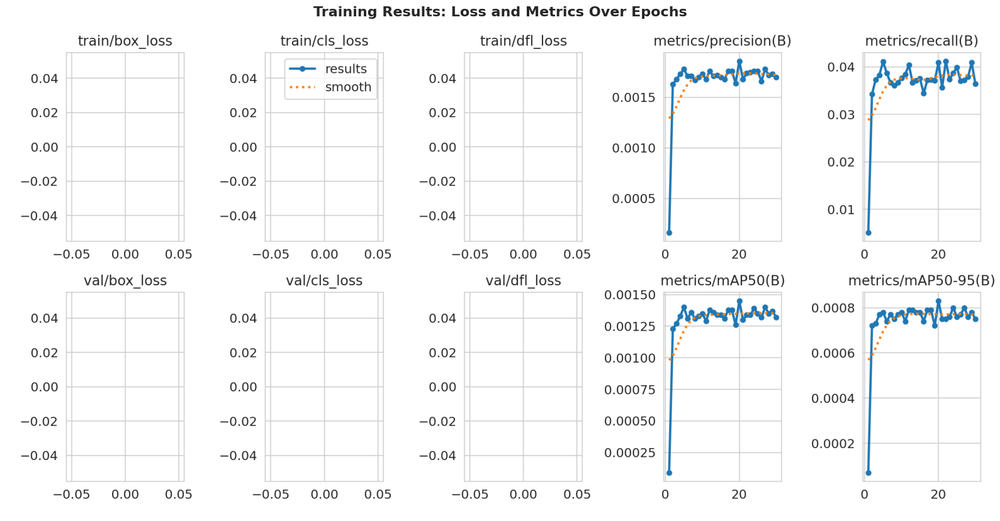

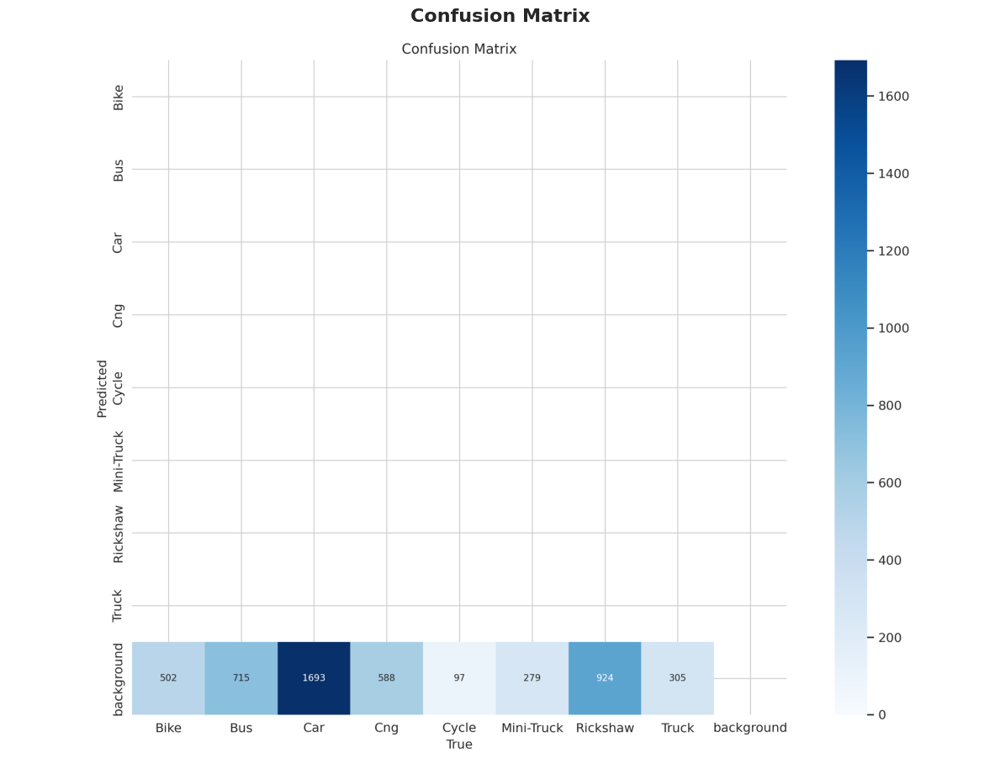

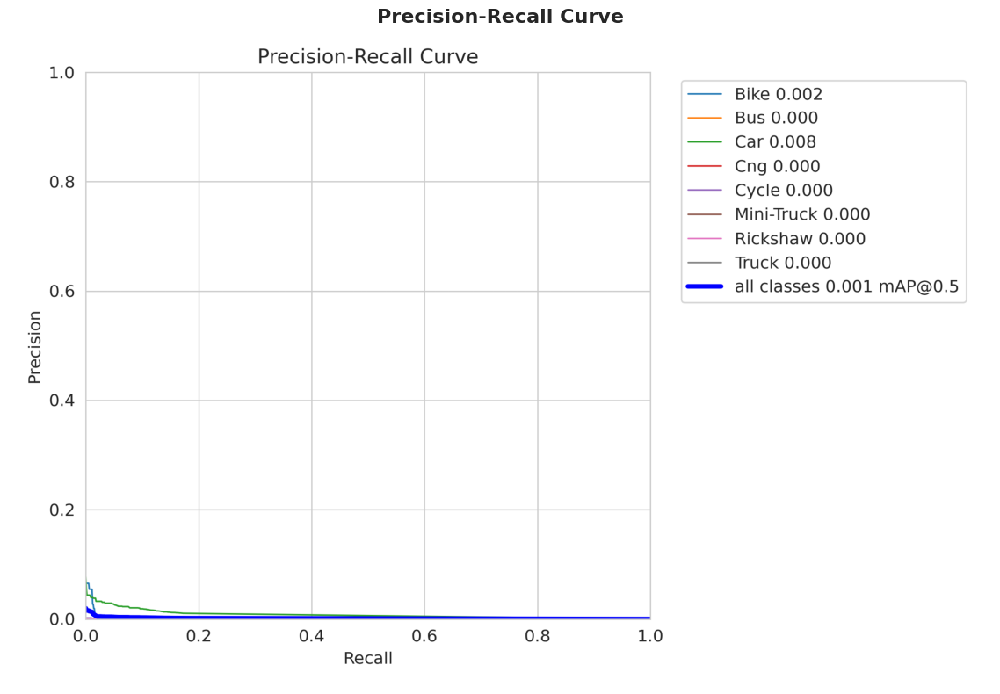

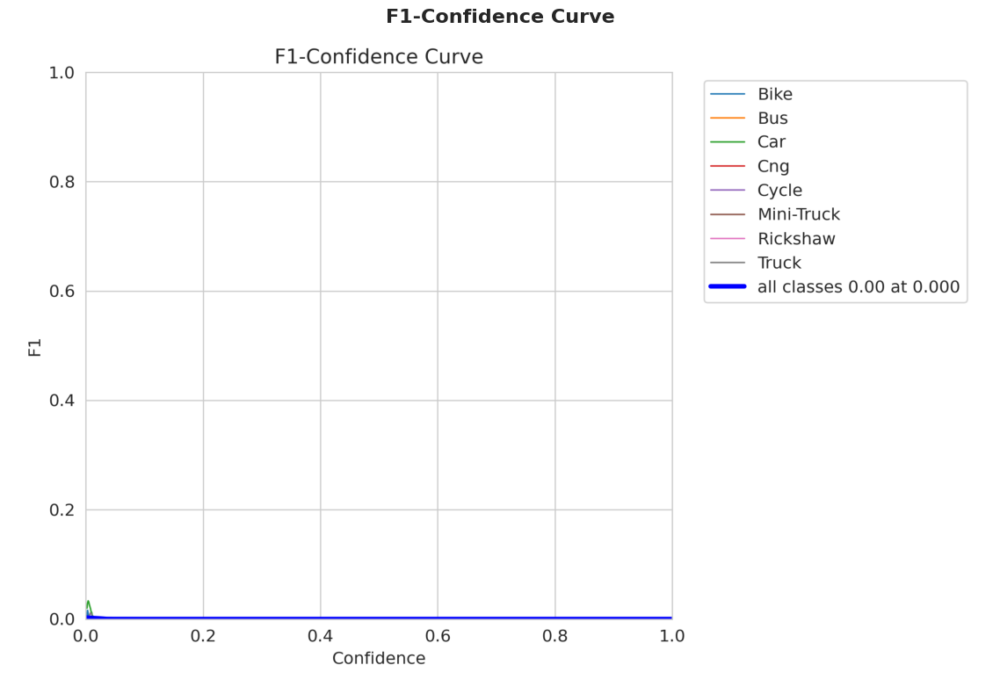

In [17]:
# Load and display training results
from PIL import Image
import os

# Path to results
results_path = 'runs/detect/traffic_detection'

# Display training curves
print("="*60)
print("TRAINING METRICS")
print("="*60)

# Check if results exist
if os.path.exists(results_path):
    # Display results image
    results_img_path = os.path.join(results_path, 'results.png')
    if os.path.exists(results_img_path):
        img = Image.open(results_img_path)
        plt.figure(figsize=(16, 10))
        plt.imshow(img)
        plt.axis('off')
        plt.title('Training Results: Loss and Metrics Over Epochs', fontsize=16, fontweight='bold')
        plt.tight_layout()
        plt.show()
    
    # Display confusion matrix
    confusion_matrix_path = os.path.join(results_path, 'confusion_matrix.png')
    if os.path.exists(confusion_matrix_path):
        img = Image.open(confusion_matrix_path)
        plt.figure(figsize=(12, 10))
        plt.imshow(img)
        plt.axis('off')
        plt.title('Confusion Matrix', fontsize=16, fontweight='bold')
        plt.tight_layout()
        plt.show()
    
    # Display precision-recall curve
    pr_curve_path = os.path.join(results_path, 'PR_curve.png')
    if os.path.exists(pr_curve_path):
        img = Image.open(pr_curve_path)
        plt.figure(figsize=(12, 8))
        plt.imshow(img)
        plt.axis('off')
        plt.title('Precision-Recall Curve', fontsize=16, fontweight='bold')
        plt.tight_layout()
        plt.show()
    
    # Display F1 curve
    f1_curve_path = os.path.join(results_path, 'F1_curve.png')
    if os.path.exists(f1_curve_path):
        img = Image.open(f1_curve_path)
        plt.figure(figsize=(12, 8))
        plt.imshow(img)
        plt.axis('off')
        plt.title('F1-Confidence Curve', fontsize=16, fontweight='bold')
        plt.tight_layout()
        plt.show()
else:
    print("Training results not found. Please run the training cell first.")

## 9. Model Evaluation on Test Set

Running inference on test images...


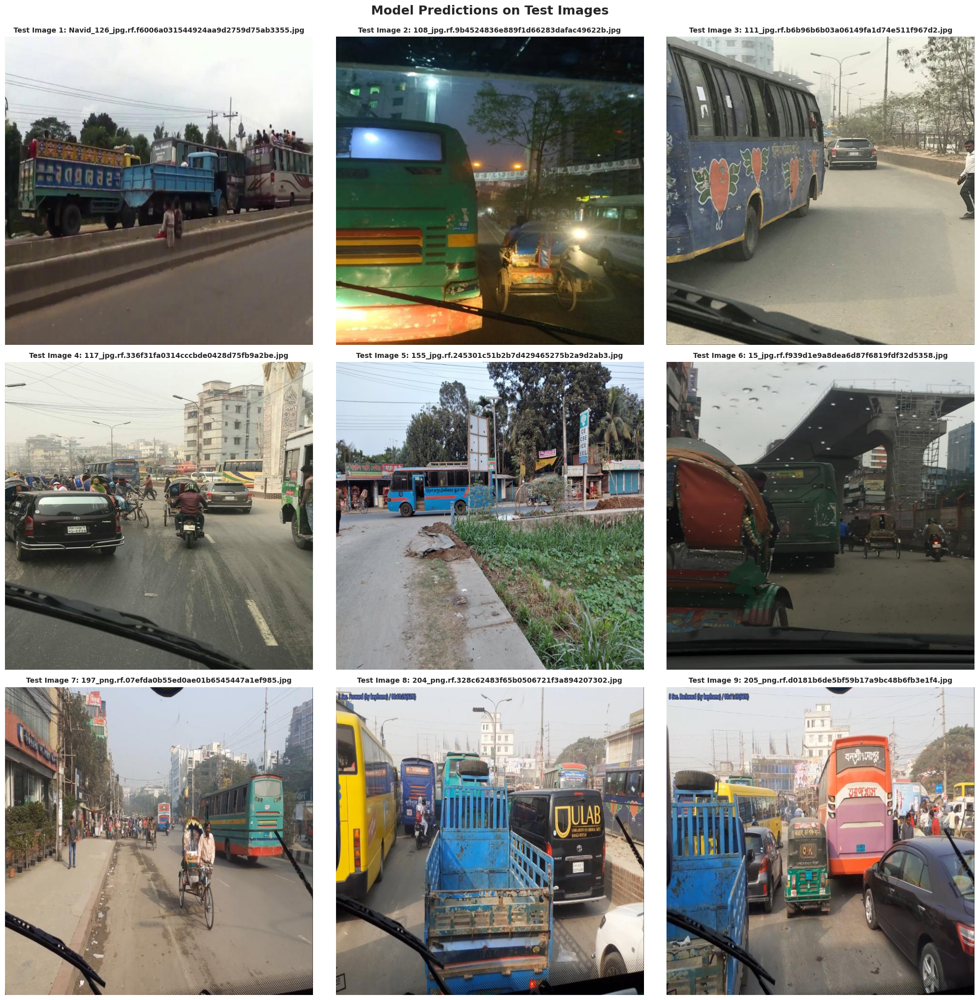

In [18]:
# Run inference on test images
if os.path.exists(best_model_path):
    # Get some test images
    test_images = list((dataset_dir / 'test' / 'images').glob('*'))[:9]
    
    fig, axes = plt.subplots(3, 3, figsize=(20, 20))
    axes = axes.flatten()
    
    print("Running inference on test images...")
    
    for idx, img_path in enumerate(test_images):
        # Run prediction
        results = best_model.predict(
            source=str(img_path),
            conf=0.25,  # confidence threshold
            iou=0.45,   # NMS IoU threshold
            verbose=False
        )
        
        # Get the plotted image
        result_img = results[0].plot()
        result_img = cv2.cvtColor(result_img, cv2.COLOR_BGR2RGB)
        
        # Display
        axes[idx].imshow(result_img)
        axes[idx].set_title(f'Test Image {idx+1}: {img_path.name}', fontsize=10, fontweight='bold')
        axes[idx].axis('off')
        
        # Print detections
        if len(results[0].boxes) > 0:
            detections = results[0].boxes
            print(f"\nImage {idx+1} - {img_path.name}:")
            for box in detections:
                cls_id = int(box.cls[0])
                conf = float(box.conf[0])
                if cls_id < len(class_names):
                    print(f"  - {class_names[cls_id]}: {conf:.2f}")
    
    plt.suptitle('Model Predictions on Test Images', fontsize=18, fontweight='bold', y=0.995)
    plt.tight_layout()
    plt.show()
else:
    print("Best model not found. Please run the training cell first.")

## 11. Export Model for Deployment

In [15]:
from ultralytics import YOLO
import torch

# Check available device
device = 0 if torch.cuda.is_available() else 'cpu'
print(f"Training on: {'GPU' if device == 0 else 'CPU'}")
if device == 0:
    print(f"GPU: {torch.cuda.get_device_name(0)}")
    print(f"GPU Memory: {torch.cuda.get_device_properties(0).total_memory / 1024**3:.2f} GB")

# Load a pretrained model
model = YOLO("yolov8n.pt")  # YOLOv8 nano - fastest, use yolov8s/m/l/x for better accuracy

# Train the model with enhanced configuration
train_results = model.train(
    data=yaml_path,  # path to dataset YAML
    
    # Training parameters
    epochs=80,  # number of training epochs
    imgsz=640,  # training image size
    batch=16,  # batch size (adjust based on GPU memory)
    
    # Early stopping and checkpointing
    patience=10,  # epochs to wait for improvement before early stopping
    save=True,  # save checkpoints
    save_period=10,  # save checkpoint every N epochs
    
    # Optimization
    optimizer='AdamW',  # optimizer (SGD, Adam, AdamW, RMSProp)
    lr0=0.01,  # initial learning rate
    lrf=0.01,  # final learning rate (lr0 * lrf)
    momentum=0.937,  # SGD momentum/Adam beta1
    weight_decay=0.0005,  # optimizer weight decay
    
    # Data augmentation
    hsv_h=0.015,  # HSV-Hue augmentation
    hsv_s=0.7,  # HSV-Saturation augmentation
    hsv_v=0.4,  # HSV-Value augmentation
    degrees=0.0,  # rotation (+/- deg)
    translate=0.1,  # translation (+/- fraction)
    scale=0.5,  # scale (+/- gain)
    shear=0.0,  # shear (+/- deg)
    perspective=0.0,  # perspective (+/- fraction)
    flipud=0.0,  # flip up-down (probability)
    fliplr=0.5,  # flip left-right (probability)
    mosaic=1.0,  # mosaic augmentation (probability)
    mixup=0.0,  # mixup augmentation (probability)
    
    # Validation and evaluation
    val=True,  # validate during training
    plots=True,  # save plots
    
    # Device
    device=device,  # device to run on
    
    # Other
    workers=8,  # number of worker threads for data loading
    project='runs/detect',  # project name
    name='traffic_detection',  # experiment name
    exist_ok=False,  # overwrite existing experiment
    pretrained=True,  # use pretrained weights
    verbose=True,  # verbose output
)

print("\n" + "="*60)
print("TRAINING COMPLETED!")
print("="*60)

Training on: GPU
GPU: NVIDIA GeForce GTX 1650
GPU Memory: 3.63 GB


100%|██████████| 6.25M/6.25M [00:01<00:00, 3.28MB/s]


New https://pypi.org/project/ultralytics/8.4.14 available 😃 Update with 'pip install -U ultralytics'
Ultralytics 8.3.5 🚀 Python-3.10.11 torch-2.5.1+cu121 CUDA:0 (NVIDIA GeForce GTX 1650, 3718MiB)
engine/trainer: task=detect, mode=train, model=yolov8n.pt, data=/mnt/Academia/Coding101/Inteligent Machine/bd-traffic-monitoring-system/Traffic-Congestion-Detection-2/data.yaml, epochs=80, time=None, patience=10, batch=16, imgsz=640, save=True, save_period=10, cache=False, device=0, workers=8, project=runs/detect, name=traffic_detection, exist_ok=False, pretrained=True, optimizer=AdamW, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visuali

100%|██████████| 5.35M/5.35M [00:01<00:00, 2.88MB/s]


AMP: checks passed ✅


train: Scanning /mnt/Academia/Coding101/Inteligent Machine/bd-traffic-monitoring-system/Traffic-Congestion-Detection-2/train/labels... 2321 images, 0 backgrounds, 0 corrupt: 100%|██████████| 2321/2321 [00:05<00:00, 410.07it/s]


train: New cache created: /mnt/Academia/Coding101/Inteligent Machine/bd-traffic-monitoring-system/Traffic-Congestion-Detection-2/train/labels.cache


val: Scanning /mnt/Academia/Coding101/Inteligent Machine/bd-traffic-monitoring-system/Traffic-Congestion-Detection-2/valid/labels... 658 images, 0 backgrounds, 0 corrupt: 100%|██████████| 658/658 [00:14<00:00, 46.30it/s] 

val: New cache created: /mnt/Academia/Coding101/Inteligent Machine/bd-traffic-monitoring-system/Traffic-Congestion-Detection-2/valid/labels.cache


Plotting labels to runs/detect/traffic_detection/labels.jpg... 
optimizer: AdamW(lr=0.01, momentum=0.937) with parameter groups 63 weight(decay=0.0), 70 weight(decay=0.0005), 69 bias(decay=0.0)
Image sizes 640 train, 640 val
Using 8 dataloader workers
Logging results to runs/detect/traffic_detection
Starting training for 80 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       1/80      3.28G        nan        nan        nan          9        640: 100%|██████████| 146/146 [03:01<00:00,  1.24s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 21/21 [00:20<00:00,  1.03it/s]


                   all        658       5103   0.000158    0.00506   9.43e-05   6.59e-05

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       2/80      3.55G        nan        nan        nan         50        640: 100%|██████████| 146/146 [02:21<00:00,  1.03it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 21/21 [00:18<00:00,  1.16it/s]


                   all        658       5103    0.00163     0.0342    0.00123   0.000723

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       3/80      3.63G        nan        nan        nan          4        640: 100%|██████████| 146/146 [02:53<00:00,  1.19s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 21/21 [00:17<00:00,  1.22it/s]


                   all        658       5103    0.00168     0.0373    0.00127   0.000734

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       4/80      3.25G        nan        nan        nan          2        640: 100%|██████████| 146/146 [02:19<00:00,  1.05it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 21/21 [00:16<00:00,  1.27it/s]


                   all        658       5103    0.00173     0.0383    0.00133   0.000767

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       5/80         3G        nan        nan        nan          9        640: 100%|██████████| 146/146 [02:18<00:00,  1.06it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 21/21 [00:16<00:00,  1.28it/s]


                   all        658       5103    0.00178     0.0411     0.0014   0.000783

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       6/80       3.1G        nan        nan        nan          3        640: 100%|██████████| 146/146 [02:18<00:00,  1.05it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 21/21 [00:15<00:00,  1.32it/s]


                   all        658       5103    0.00171     0.0387    0.00131   0.000737

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       7/80      3.53G        nan        nan        nan          1        640: 100%|██████████| 146/146 [02:18<00:00,  1.05it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 21/21 [00:16<00:00,  1.28it/s]


                   all        658       5103    0.00171     0.0367    0.00136   0.000774

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       8/80       3.2G        nan        nan        nan         21        640: 100%|██████████| 146/146 [02:18<00:00,  1.05it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 21/21 [00:16<00:00,  1.27it/s]


                   all        658       5103    0.00167     0.0361    0.00131   0.000747

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       9/80      3.65G        nan        nan        nan          6        640: 100%|██████████| 146/146 [02:18<00:00,  1.05it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 21/21 [00:16<00:00,  1.28it/s]


                   all        658       5103     0.0017     0.0367    0.00133   0.000766

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      10/80      3.59G        nan        nan        nan          2        640: 100%|██████████| 146/146 [02:18<00:00,  1.05it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 21/21 [00:15<00:00,  1.33it/s]

                   all        658       5103    0.00173     0.0377    0.00135   0.000783



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      11/80      3.34G        nan        nan        nan         21        640: 100%|██████████| 146/146 [02:18<00:00,  1.05it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 21/21 [00:16<00:00,  1.25it/s]


                   all        658       5103    0.00168     0.0385    0.00129   0.000738

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      12/80      2.93G        nan        nan        nan          4        640: 100%|██████████| 146/146 [02:19<00:00,  1.04it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 21/21 [00:16<00:00,  1.30it/s]


                   all        658       5103    0.00176     0.0404    0.00138   0.000791

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      13/80      3.24G        nan        nan        nan          3        640: 100%|██████████| 146/146 [02:18<00:00,  1.05it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 21/21 [00:15<00:00,  1.31it/s]


                   all        658       5103    0.00171     0.0367    0.00136   0.000791

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      14/80      3.08G        nan        nan        nan         59        640: 100%|██████████| 146/146 [02:18<00:00,  1.06it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 21/21 [00:16<00:00,  1.28it/s]


                   all        658       5103    0.00172     0.0371    0.00134   0.000776

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      15/80      3.41G        nan        nan        nan         19        640: 100%|██████████| 146/146 [02:18<00:00,  1.06it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 21/21 [00:16<00:00,  1.30it/s]


                   all        658       5103     0.0017     0.0376    0.00134   0.000778

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      16/80      3.45G        nan        nan        nan         25        640: 100%|██████████| 146/146 [02:19<00:00,  1.05it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 21/21 [00:16<00:00,  1.31it/s]


                   all        658       5103    0.00168     0.0344    0.00131   0.000744

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      17/80      3.33G        nan        nan        nan          3        640: 100%|██████████| 146/146 [02:18<00:00,  1.05it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 21/21 [00:16<00:00,  1.30it/s]


                   all        658       5103    0.00176     0.0373    0.00138   0.000789

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      18/80      3.71G        nan        nan        nan         10        640: 100%|██████████| 146/146 [02:19<00:00,  1.05it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 21/21 [00:16<00:00,  1.27it/s]


                   all        658       5103    0.00176     0.0373    0.00138   0.000791

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      19/80      3.53G        nan        nan        nan         17        640: 100%|██████████| 146/146 [02:17<00:00,  1.06it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 21/21 [00:15<00:00,  1.31it/s]


                   all        658       5103    0.00164     0.0372    0.00126   0.000722

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      20/80      3.14G        nan        nan        nan          6        640: 100%|██████████| 146/146 [02:19<00:00,  1.05it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 21/21 [00:16<00:00,  1.27it/s]


                   all        658       5103    0.00186     0.0409    0.00145   0.000835

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      21/80      3.35G        nan        nan        nan          6        640: 100%|██████████| 146/146 [02:17<00:00,  1.06it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 21/21 [00:13<00:00,  1.53it/s]

                   all        658       5103    0.00168     0.0356     0.0013   0.000745



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      22/80      3.28G        nan        nan        nan          9        640: 100%|██████████| 146/146 [02:32<00:00,  1.05s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 21/21 [00:16<00:00,  1.24it/s]


                   all        658       5103    0.00174     0.0412    0.00134    0.00075

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      23/80         3G        nan        nan        nan         10        640: 100%|██████████| 146/146 [02:25<00:00,  1.00it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 21/21 [00:15<00:00,  1.39it/s]


                   all        658       5103    0.00175     0.0374    0.00134   0.000764

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      24/80      3.22G        nan        nan        nan         22        640: 100%|██████████| 146/146 [02:29<00:00,  1.02s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 21/21 [00:16<00:00,  1.26it/s]


                   all        658       5103    0.00176     0.0387    0.00139   0.000803

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      25/80      3.46G        nan        nan        nan         10        640: 100%|██████████| 146/146 [02:24<00:00,  1.01it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 21/21 [00:16<00:00,  1.27it/s]


                   all        658       5103    0.00176     0.0399    0.00135   0.000763

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      26/80      3.31G        nan        nan        nan         12        640: 100%|██████████| 146/146 [02:19<00:00,  1.05it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 21/21 [00:16<00:00,  1.26it/s]


                   all        658       5103    0.00166      0.037    0.00132   0.000767

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      27/80      3.47G        nan        nan        nan          5        640: 100%|██████████| 146/146 [02:18<00:00,  1.06it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 21/21 [00:16<00:00,  1.30it/s]


                   all        658       5103    0.00178     0.0372     0.0014   0.000796

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      28/80       3.1G        nan        nan        nan          9        640: 100%|██████████| 146/146 [02:18<00:00,  1.05it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 21/21 [00:14<00:00,  1.46it/s]


                   all        658       5103    0.00172     0.0379    0.00135   0.000762

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      29/80      3.11G        nan        nan        nan          6        640: 100%|██████████| 146/146 [02:18<00:00,  1.06it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 21/21 [00:14<00:00,  1.46it/s]

                   all        658       5103    0.00173     0.0409    0.00137   0.000777



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      30/80      3.07G        nan        nan        nan          7        640: 100%|██████████| 146/146 [02:19<00:00,  1.05it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 21/21 [00:16<00:00,  1.26it/s]


                   all        658       5103     0.0017     0.0364    0.00132   0.000748
EarlyStopping: Training stopped early as no improvement observed in last 10 epochs. Best results observed at epoch 20, best model saved as best.pt.
To update EarlyStopping(patience=10) pass a new patience value, i.e. `patience=300` or use `patience=0` to disable EarlyStopping.

30 epochs completed in 1.359 hours.
Optimizer stripped from runs/detect/traffic_detection/weights/last.pt, 5.6MB
Optimizer stripped from runs/detect/traffic_detection/weights/best.pt, 5.6MB

Validating runs/detect/traffic_detection/weights/best.pt...
Ultralytics 8.3.5 🚀 Python-3.10.11 torch-2.5.1+cu121 CUDA:0 (NVIDIA GeForce GTX 1650, 3718MiB)
Model summary (fused): 186 layers, 2,685,928 parameters, 0 gradients, 6.8 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  14%|█▍        | 3/21 [00:02<00:15,  1.13it/s]invalid value encountered in cast
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 21/21 [00:16<00:00,  1.30it/s]


                   all        658       5103    0.00188     0.0414    0.00146   0.000836
                  Bike        265        502     0.0032     0.0239    0.00246    0.00103
                   Bus        346        715   8.62e-05     0.0028   4.33e-05    2.6e-05
                   Car        404       1693     0.0105      0.171    0.00829    0.00518
                   Cng        247        588          0          0          0          0
                 Cycle         82         97   0.000303     0.0722   0.000191   9.31e-05
            Mini-Truck        185        279    2.2e-05    0.00358   1.11e-05   1.11e-06
              Rickshaw        253        924   0.000434     0.0119    0.00022   0.000122
                 Truck        187        305   0.000483     0.0459   0.000437   0.000242
Speed: 0.7ms preprocess, 17.1ms inference, 0.3ms loss, 4.1ms postprocess per image
Results saved to runs/detect/traffic_detection

TRAINING COMPLETED!


In [12]:
best_model_path = os.path.join('/mnt/Academia/Coding101/Inteligent Machine/bd-traffic-monitoring-system/runs/detect/traffic_detection', 'weights', 'best.pt')
from ultralytics import YOLO


## 8. Training Results Visualization

In [16]:
# Load the best model and evaluate on test set
best_model_path = os.path.join('/mnt/Academia/Coding101/Inteligent Machine/bd-traffic-monitoring-system/runs/detect/traffic_detection', 'weights', 'best.pt')

if os.path.exists(best_model_path):
    # Load best model
    best_model = YOLO(best_model_path)
    
    print("="*60)
    print("MODEL EVALUATION ON TEST SET")
    print("="*60)
    
    # Evaluate on test set
    test_results = best_model.val(
        data='/mnt/Academia/Coding101/Inteligent Machine/bd-traffic-monitoring-system/Traffic-Congestion-Detection-2/data.yaml',
        split='test',
        batch=16,
        imgsz=640,
        plots=True,
        save_json=True,
        save_hybrid=True
    )
    

    
    # Per-class metrics
    # print(f"\nPer-Class Average Precision (AP@0.5):")
    # if hasattr(test_results, 'ap_class_index'):
    #     for idx, ap in enumerate(test_results.ap50):
    #         if idx < len(class_names):
    #             print(f"  {class_names[idx]:<15}: {ap:.4f}")
    
    print("="*60)
else:
    print("Best model not found. Please run the training cell first.")

MODEL EVALUATION ON TEST SET
WARNING ⚠️ 'save_hybrid=True' will append ground truth to predictions for autolabelling.
WARNING ⚠️ 'save_hybrid=True' will cause incorrect mAP.

Ultralytics 8.3.5 🚀 Python-3.10.11 torch-2.5.1+cu121 CPU (AMD Ryzen 5 5600H with Radeon Graphics)
Model summary (fused): 186 layers, 2,685,928 parameters, 0 gradients, 6.8 GFLOPs


val: Scanning /mnt/Academia/Coding101/Inteligent Machine/bd-traffic-monitoring-system/Traffic-Congestion-Detection-2/test/labels.cache... 351 images, 0 backgrounds, 0 corrupt: 100%|██████████| 351/351 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):   5%|▍         | 1/22 [00:02<00:51,  2.45s/it]/mnt/uFiles/miniConda/envs/im/lib/python3.10/site-packages/ultralytics/utils/plotting.py:1091: RuntimeWarning: invalid value encountered in cast
  for j, box in enumerate(boxes.astype(np.int64).tolist()):
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 22/22 [01:15<00:00,  3.44s/it]


                   all        351       2885          1      0.999      0.995      0.995
                  Bike        129        228          1          1      0.995      0.995
                   Bus        204        428          1          1      0.995      0.995
                   Car        228        994          1      0.998      0.995      0.995
                   Cng        139        326          1      0.994      0.995      0.995
                 Cycle         35         51          1          1      0.995      0.995
            Mini-Truck        100        163          1          1      0.995      0.995
              Rickshaw        127        514          1          1      0.995      0.995
                 Truck        101        181          1          1      0.995      0.995
Speed: 3.1ms preprocess, 99.5ms inference, 0.0ms loss, 19.4ms postprocess per image
Saving runs/detect/val4/predictions.json...
Results saved to runs/detect/val4


MODEL DIAGNOSTIC TEST

Testing on: 02_jpg.rf.4a09a77b1c1ba94c59f01e95b9631285.jpg
Model classes: {0: 'Bike', 1: 'Bus', 2: 'Car', 3: 'Cng', 4: 'Cycle', 5: 'Mini-Truck', 6: 'Rickshaw', 7: 'Truck'}

image 1/1 /mnt/Academia/Coding101/Inteligent Machine/bd-traffic-monitoring-system/Traffic-Congestion-Detection-2/train/images/02_jpg.rf.4a09a77b1c1ba94c59f01e95b9631285.jpg: 640x640 3 Cars, 1 Rickshaw, 2 Trucks, 69.1ms
Speed: 1.9ms preprocess, 69.1ms inference, 1.7ms postprocess per image at shape (1, 3, 640, 640)

Number of detections: 6

✓ Model IS detecting objects!

Detected classes and confidence scores:
  - Class 2 (Car): confidence 0.037
  - Class 2 (Car): confidence 0.028
  - Class 7 (Truck): confidence 0.017
  - Class 6 (Rickshaw): confidence 0.016
  - Class 7 (Truck): confidence 0.015
  - Class 2 (Car): confidence 0.014


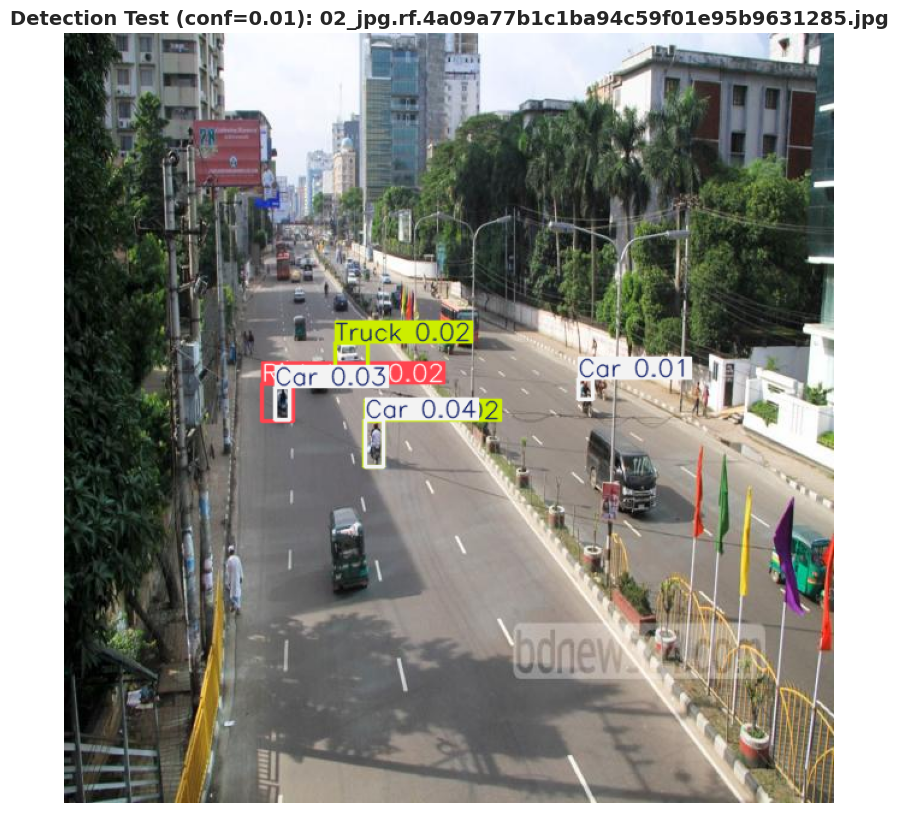

In [69]:
# Diagnostic Test: Check if model can detect anything
from ultralytics import YOLO
import cv2
import matplotlib.pyplot as plt

best_model_path = '/mnt/Academia/Coding101/Inteligent Machine/bd-traffic-monitoring-system/runs/detect/traffic_detection/weights/best.pt'

if os.path.exists(best_model_path):
    print("="*60)
    print("MODEL DIAGNOSTIC TEST")
    print("="*60)
    
    # Load model
    test_model = YOLO(best_model_path)
    
    # Test on a training image first (should definitely work)
    test_img = list((dataset_dir / 'train' / 'images').glob('*'))[0]
    
    print(f"\nTesting on: {test_img.name}")
    print(f"Model classes: {test_model.names}")
    
    # Run with VERY LOW confidence to see everything
    results = test_model.predict(
        source=str(test_img),
        conf=0.01,  # Very low threshold to catch everything
        verbose=True
    )
    
    print(f"\nNumber of detections: {len(results[0].boxes)}")
    
    if len(results[0].boxes) > 0:
        print("\n✓ Model IS detecting objects!")
        print("\nDetected classes and confidence scores:")
        for box in results[0].boxes:
            cls_id = int(box.cls[0])
            conf = float(box.conf[0])
            class_name = test_model.names[cls_id]
            print(f"  - Class {cls_id} ({class_name}): confidence {conf:.3f}")
        
        # Show the detection
        result_img = results[0].plot()
        result_img = cv2.cvtColor(result_img, cv2.COLOR_BGR2RGB)
        plt.figure(figsize=(15, 10))
        plt.imshow(result_img)
        plt.title(f'Detection Test (conf=0.01): {test_img.name}', fontsize=14, fontweight='bold')
        plt.axis('off')
        plt.show()
    else:
        print("\n✗ NO DETECTIONS FOUND!")
        print("Possible issues:")
        print("1. Model might not be properly trained")
        print("2. Check if training actually completed successfully")
        print("3. Verify the model file is not corrupted")
        
        # Show image anyway
        img = cv2.imread(str(test_img))
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        plt.figure(figsize=(15, 10))
        plt.imshow(img)
        plt.title(f'Original Image (No detections): {test_img.name}', fontsize=14, fontweight='bold')
        plt.axis('off')
        plt.show()
else:
    print("✗ Model file not found!")
    print(f"Looking for: {best_model_path}")
    print("\nMake sure you've trained the model first (run cell 19)")

In [10]:
# Export model to different formats for deployment
if os.path.exists(best_model_path):
    best_model = YOLO(best_model_path)

    print("="*60)
    print("EXPORTING MODEL FOR DEPLOYMENT")
    print("="*60)
    
    # Export to ONNX (recommended for production)
    print("\n1. Exporting to ONNX format...")
    onnx_path = best_model.export(format='onnx', dynamic=True, simplify=True)
    print(f"   ✓ ONNX model saved: {onnx_path}")
    
    # Export to TorchScript
    print("\n2. Exporting to TorchScript format...")
    torchscript_path = best_model.export(format='torchscript')
    print(f"   ✓ TorchScript model saved: {torchscript_path}")
    
    
    print("\n" + "="*60)
    print("Model export completed!")
    print("="*60)
    
    # Display model info
    print(f"\nModel Summary:")
    print(f"  Architecture: YOLOv8 nano")
    print(f"  Input size: 640x640")
    # print(f"  Classes: {num_classes}")
    print(f"  Best weights: {best_model_path}")
else:
    print("Best model not found. Please run the training cell first.")

EXPORTING MODEL FOR DEPLOYMENT

1. Exporting to ONNX format...
Ultralytics 8.3.5 🚀 Python-3.10.11 torch-2.5.1+cu121 CPU (AMD Ryzen 5 5600H with Radeon Graphics)
Model summary (fused): 186 layers, 2,685,928 parameters, 0 gradients, 6.8 GFLOPs

PyTorch: starting from '/mnt/Academia/Coding101/Inteligent Machine/bd-traffic-monitoring-system/runs/detect/traffic_detection/weights/best.pt' with input shape (1, 3, 640, 640) BCHW and output shape(s) (1, 12, 8400) (5.4 MB)

ONNX: starting export with onnx 1.20.1 opset 19...
ONNX: slimming with onnxslim 0.1.34...
ONNX: export success ✅ 14.2s, saved as '/mnt/Academia/Coding101/Inteligent Machine/bd-traffic-monitoring-system/runs/detect/traffic_detection/weights/best.onnx' (10.4 MB)

Export complete (14.8s)
Results saved to /mnt/Academia/Coding101/Inteligent Machine/bd-traffic-monitoring-system/runs/detect/traffic_detection/weights
Predict:         yolo predict task=detect model=/mnt/Academia/Coding101/Inteligent Machine/bd-traffic-monitoring-syste